
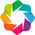

/Users/dalek/anaconda2/lib/python2.7/site-packages/yt/fields/local_fields.py:46: UserWarning: Because 'sampling_type' not specified, yt will assume a cell 'sampling_type'
  warnings.warn("Because 'sampling_type' not specified, yt will "


In [1]:
import holoviews as hv
import holoviews.util
hv.extension('bokeh')
#hv.extension('matplotlib')

import numpy as np
import yt
import pandas as pd
import datashader as dshade
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import trident
import cPickle
import matplotlib as mpl

from emission_functions import *
from radial_data_nozeros import *
from astropy.table import Table
from holoviews.operation.datashader import aggregate, datashade, dynspread, shade
from holoviews.operation import decimate
from holoviews.operation import histogram

In [2]:
base = "/Users/dalek/data/Molly/nref11n_nref10f_refine200kpc_z4to2"
fn = base+"/RD0020/RD0020"
lines = ['HAlpha','OVI','CIV','CIII_977','SiIV']
track_name = base+"/halo_track"
args = fn.split('/')

fontcs ={'fontname':'Helvetica','fontsize':16}
mpl.rc('text', usetex=True)

dsREF = yt.load(fn)
track = Table.read(track_name, format='ascii')
track.sort('col1')
rbREF,rb_centerREF,rb_widthREF = get_refine_box(dsREF,dsREF.current_redshift,track)
redshift = dsREF.current_redshift

fn = "/Users/dalek/data/Molly/natural/nref11/RD0020/RD0020"
dsNAT = yt.load(fn)
rbNAT,rb_centerNAT,rb_widthNAT = get_refine_box(dsNAT,dsNAT.current_redshift,track)

box_width = dsREF.arr(rb_widthREF,'code_length').in_units('kpc')

yt : [INFO     ] 2018-02-01 16:37:29,120 Parameters: current_time              = 154.801032717
yt : [INFO     ] 2018-02-01 16:37:29,121 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-02-01 16:37:29,124 Parameters: domain_left_edge          = [ 0.  0.  0.]
yt : [INFO     ] 2018-02-01 16:37:29,126 Parameters: domain_right_edge         = [ 1.  1.  1.]
yt : [INFO     ] 2018-02-01 16:37:29,128 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-02-01 16:37:29,130 Parameters: current_redshift          = 1.99999968795
yt : [INFO     ] 2018-02-01 16:37:29,131 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-02-01 16:37:29,133 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-02-01 16:37:29,134 Parameters: hubble_constant           = 0.695


using this loc:      col1       col2     col3     col4     col5     col6     col7   col8
------------- -------- -------- -------- -------- -------- -------- ----
2.04999996364 0.493091 0.488119 0.501099 0.495091 0.490119 0.503099   10


yt : [INFO     ] 2018-02-01 16:37:29,214 Parameters: current_time              = 154.801187733
yt : [INFO     ] 2018-02-01 16:37:29,215 Parameters: domain_dimensions         = [256 256 256]
yt : [INFO     ] 2018-02-01 16:37:29,216 Parameters: domain_left_edge          = [ 0.  0.  0.]
yt : [INFO     ] 2018-02-01 16:37:29,218 Parameters: domain_right_edge         = [ 1.  1.  1.]
yt : [INFO     ] 2018-02-01 16:37:29,220 Parameters: cosmological_simulation   = 1
yt : [INFO     ] 2018-02-01 16:37:29,221 Parameters: current_redshift          = 1.99999762534
yt : [INFO     ] 2018-02-01 16:37:29,222 Parameters: omega_lambda              = 0.715
yt : [INFO     ] 2018-02-01 16:37:29,223 Parameters: omega_matter              = 0.285
yt : [INFO     ] 2018-02-01 16:37:29,224 Parameters: hubble_constant           = 0.695


using this loc:      col1       col2     col3     col4     col5     col6     col7   col8
------------- -------- -------- -------- -------- -------- -------- ----
1.99999996364 0.493032 0.487924 0.501169 0.495032 0.489924 0.503169   10


In [3]:
print 'dens'
dens = np.log10(rbREF['H_nuclei_density'])
print 'temp'
temp = np.log10(rbREF['Temperature'])
Zgas = np.log10(rbREF['metallicity'])
x = rbREF['x']
y = rbREF['y']
z = rbREF['z']
vx = rbREF['velocity_x'].in_units('km/s')
vy = rbREF['velocity_y'].in_units('km/s')
vz = rbREF['velocity_z'].in_units('km/s')

halo_center = dsREF.arr(rb_centerREF,'code_length')
dist = np.sqrt((halo_center[0]-x)**2.+(halo_center[1]-y)**2.+(halo_center[2]-z)**2.).in_units('kpc')

dfREF = pd.DataFrame({'temp':temp, 'dens':dens, 'Zgas':Zgas,
                   'x':x,'y':y,'z':z,'dist':dist,
                   'vx':vx,'vy':vy,'vz':vz})

dens = np.log10(rbNAT['H_nuclei_density'])
temp = np.log10(rbNAT['Temperature'])
Zgas = np.log10(rbNAT['metallicity'])
x = rbNAT['x']
y = rbNAT['y']
z = rbNAT['z']
vx = rbNAT['velocity_x'].in_units('km/s')
vy = rbNAT['velocity_y'].in_units('km/s')
vz = rbNAT['velocity_z'].in_units('km/s')

halo_center = dsNAT.arr(rb_centerNAT,'code_length')
dist = np.sqrt((halo_center[0]-x)**2.+(halo_center[1]-y)**2.+(halo_center[2]-z)**2.).in_units('kpc')

dfNAT = pd.DataFrame({'temp':temp, 'dens':dens, 'Zgas':Zgas,
                   'x':x,'y':y,'z':z,'dist':dist,
                   'vx':vx,'vy':vy,'vz':vz})


dens


Parsing Hierarchy : 100%|██████████| 4574/4574 [00:00<00:00, 26195.21it/s]
yt : [INFO     ] 2018-02-01 16:37:36,102 Gathering a field list (this may take a moment.)


temp


Parsing Hierarchy : 100%|██████████| 1449/1449 [00:00<00:00, 9271.89it/s]
yt : [INFO     ] 2018-02-01 16:41:40,133 Gathering a field list (this may take a moment.)


In [4]:
%%output size=100 filename='basic_dists_velocity' fig='html'

vx_dist = hv.Scatter(dfREF,kdims=['dist'],vdims=['vx'],label="vx [km/s]")
vy_dist = hv.Scatter(dfREF,kdims=['dist'],vdims=['vy'],label='vy [km/s]')
vz_dist = hv.Scatter(dfREF,kdims=['dist'],vdims=['vz'],label='vz [km/s]')
dist_plots = (datashade(vx_dist,cmap=cm.Reds) + datashade(vy_dist,cmap=cm.Blues) + datashade(vz_dist,cmap=cm.BuGn))

vx_dist2 = hv.Scatter(dfNAT,kdims=['dist'],vdims=['vx'],label="vx [km/s]")
vy_dist2 = hv.Scatter(dfNAT,kdims=['dist'],vdims=['vy'],label='vy [km/s]')
vz_dist2 = hv.Scatter(dfNAT,kdims=['dist'],vdims=['vz'],label='vz [km/s]')
dist_plots2 = (datashade(vx_dist2,cmap=cm.Reds) + datashade(vy_dist2,cmap=cm.Blues) + datashade(vz_dist2,cmap=cm.BuGn))

dist_plots_all = dist_plots + dist_plots2

dist_plots_all.cols(3)


:Layout
   .DynamicMap.I   :DynamicMap   []
   .DynamicMap.II  :DynamicMap   []
   .DynamicMap.III :DynamicMap   []
   .DynamicMap.IV  :DynamicMap   []
   .DynamicMap.V   :DynamicMap   []
   .DynamicMap.VI  :DynamicMap   []

In [5]:
%%output size=100 filename='basic_dists_velocity' fig='html'

vx_dist = hv.Scatter(dfREF,kdims=['vx'],vdims=['Zgas'],label="vx [km/s]")
vy_dist = hv.Scatter(dfREF,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
vz_dist = hv.Scatter(dfREF,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
dist_plots = (datashade(vx_dist,cmap=cm.Reds) + datashade(vy_dist,cmap=cm.Blues) + datashade(vz_dist,cmap=cm.BuGn))

vx_dist2 = hv.Scatter(dfNAT,kdims=['vx'],vdims=['Zgas'],label="vx [km/s]")
vy_dist2 = hv.Scatter(dfNAT,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
vz_dist2 = hv.Scatter(dfNAT,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
dist_plots2 = (datashade(vx_dist2,cmap=cm.Reds) + datashade(vy_dist2,cmap=cm.Blues) + datashade(vz_dist2,cmap=cm.BuGn))

dist_plots_all = dist_plots + dist_plots2

dist_plots_all.cols(3)


:Layout
   .DynamicMap.I   :DynamicMap   []
   .DynamicMap.II  :DynamicMap   []
   .DynamicMap.III :DynamicMap   []
   .DynamicMap.IV  :DynamicMap   []
   .DynamicMap.V   :DynamicMap   []
   .DynamicMap.VI  :DynamicMap   []

In [9]:
%%output size=100 filename='basic_dists_velocity' fig='html'

vx_dist = hv.Scatter(dfREF,kdims=['dens'],vdims=['Zgas'],label="Refined")
#vy_dist = hv.Scatter(dfREF,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
#vz_dist = hv.Scatter(dfREF,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
#dist_plots = (datashade(vx_dist,cmap=cm.Reds) + datashade(vy_dist,cmap=cm.Blues) + datashade(vz_dist,cmap=cm.BuGn))

vx_dist2 = hv.Scatter(dfNAT,kdims=['dens'],vdims=['Zgas'],label="Natural")
#vy_dist2 = hv.Scatter(dfNAT,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
#vz_dist2 = hv.Scatter(dfNAT,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
#dist_plots2 = (datashade(vx_dist2,cmap=cm.Reds) + datashade(vy_dist2,cmap=cm.Blues) + datashade(vz_dist2,cmap=cm.BuGn))

dens_metal = datashade(vx_dist,cmap=cm.Reds) + datashade(vx_dist2,cmap=cm.Blues)
dens_metal
#dist_plots_all = dist_plots + dist_plots2

#dist_plots_all.cols(3)


:Layout
   .DynamicMap.I  :DynamicMap   []
   .DynamicMap.II :DynamicMap   []

In [10]:
%%output size=100 filename='basic_dists_velocity' fig='html'

vx_dist = hv.Scatter(dfREF,kdims=['temp'],vdims=['Zgas'],label="Refined")
#vy_dist = hv.Scatter(dfREF,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
#vz_dist = hv.Scatter(dfREF,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
#dist_plots = (datashade(vx_dist,cmap=cm.Reds) + datashade(vy_dist,cmap=cm.Blues) + datashade(vz_dist,cmap=cm.BuGn))

vx_dist2 = hv.Scatter(dfNAT,kdims=['temp'],vdims=['Zgas'],label="Natural")
#vy_dist2 = hv.Scatter(dfNAT,kdims=['vy'],vdims=['Zgas'],label='vy [km/s]')
#vz_dist2 = hv.Scatter(dfNAT,kdims=['vz'],vdims=['Zgas'],label='vz [km/s]')
#dist_plots2 = (datashade(vx_dist2,cmap=cm.Reds) + datashade(vy_dist2,cmap=cm.Blues) + datashade(vz_dist2,cmap=cm.BuGn))

temp_metal = datashade(vx_dist,cmap=cm.Reds) + datashade(vx_dist2,cmap=cm.Blues)
dist_plots_all = dens_metal + temp_metal
#dist_plots_all = dist_plots + dist_plots2

dist_plots_all.cols(2)


:Layout
   .DynamicMap.I   :DynamicMap   []
      :RGB   [dens,Zgas]   (R,G,B,A)
   .DynamicMap.II  :DynamicMap   []
      :RGB   [dens,Zgas]   (R,G,B,A)
   .DynamicMap.III :DynamicMap   []
   .DynamicMap.IV  :DynamicMap   []